In [2]:
#bibliothèques utiles
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from numpy import isnan
import seaborn as sns
import statsmodels as stat
import scipy as scp
from matplotlib.pyplot import figure
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFE
from sklearn.datasets import make_friedman1
from sklearn.svm import SVR
from sklearn.metrics import confusion_matrix,accuracy_score

In [3]:
#importer le fichier
header = ['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba',
         'bgr', 'bu',  'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc',
         'rc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane',
         'class']
data= pd.read_csv('chronic_kidney_disease.csv',header=None,
names=header,
na_values='?')
data.head()


,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,class
NaN,Age,Blood Pressure,Specific Gravity,Albumin,Sugar,Red Blood Cells,Pus Cell,Pus Cell Clumps,Bacteria,Blood Glucose Random,...,Packed Cell Volume,White Blood Cell Count,Red Blood Cell Count,Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Class
0.0,48.0,80.0,1.02,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,...,44.0,7800.0,5.2,yes,yes,no,good,no,no,ckd
1.0,7.0,50.0,1.02,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,...,38.0,6000.0,NaN,no,no,no,good,no,no,ckd
2.0,62.0,80.0,1.01,2.0,3.0,normal,normal,notpresent,notpresent,423.0,...,31.0,7500.0,NaN,no,yes,no,poor,no,yes,ckd
3.0,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,...,32.0,6700.0,3.9,yes,no,no,poor,yes,yes,ckd


### DATA VISUALISATION

In [4]:
#structure des données
data.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 401 entries, nan to 399.0
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   age     392 non-null    object
 1   bp      389 non-null    object
 2   sg      354 non-null    object
 3   al      355 non-null    object
 4   su      352 non-null    object
 5   rbc     249 non-null    object
 6   pc      336 non-null    object
 7   pcc     397 non-null    object
 8   ba      397 non-null    object
 9   bgr     357 non-null    object
 10  bu      382 non-null    object
 11  sc      384 non-null    object
 12  sod     314 non-null    object
 13  pot     313 non-null    object
 14  hemo    349 non-null    object
 15  pcv     330 non-null    object
 16  wc      295 non-null    object
 17  rc      270 non-null    object
 18  htn     399 non-null    object
 19  dm      399 non-null    object
 20  cad     399 non-null    object
 21  appet   400 non-null    object
 22  pe      400 non-null

Nous remarquons que sur notre data nous avons plusieurs types de données incompatibles(ex: pcv et cv qui sont de type object au lieu de float). Nous allons devoir les convertir

In [5]:
for i in ['rc','wc','pcv']:
    data[i] = pd.to_numeric(data[i],errors = 'coerce')
data.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 401 entries, nan to 399.0
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     392 non-null    object 
 1   bp      389 non-null    object 
 2   sg      354 non-null    object 
 3   al      355 non-null    object 
 4   su      352 non-null    object 
 5   rbc     249 non-null    object 
 6   pc      336 non-null    object 
 7   pcc     397 non-null    object 
 8   ba      397 non-null    object 
 9   bgr     357 non-null    object 
 10  bu      382 non-null    object 
 11  sc      384 non-null    object 
 12  sod     314 non-null    object 
 13  pot     313 non-null    object 
 14  hemo    349 non-null    object 
 15  pcv     329 non-null    float64
 16  wc      294 non-null    float64
 17  rc      269 non-null    float64
 18  htn     399 non-null    object 
 19  dm      399 non-null    object 
 20  cad     399 non-null    object 
 21  appet   400 non-null    object 
 

In [6]:
#data describe
data.describe()

,pcv,wc,rc
count,329.000000,294.000000,269.000000
mean,38.884498,8406.122449,4.707435
std,8.990105,2944.474190,1.025323
min,9.000000,2200.000000,2.100000
25%,32.000000,6500.000000,3.900000
50%,40.000000,8000.000000,4.800000
75%,45.000000,9800.000000,5.400000
max,54.000000,26400.000000,8.000000


Sur notre data nous avons plusieurs valeurs nominales incompatibles (ex: les valeurs de dm sont no ou yes mais nous avons /tyes et /tno) donc nous devons les remplacer par yes or no

In [7]:
data['dm'] = data['dm'].replace(to_replace={'\tno':'no','\tyes':'yes',' yes':'yes'})
data['cad'] = data['cad'].replace(to_replace={'\tno':'no'})
data['class'] = data['class'].replace(to_replace={'ckd\t':'ckd'})

In [71]:
#import sys
#!{sys.executable} -m pip install pandas-profiling
import pandas_profiling 

pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [72]:
#visualisation des données
#----------------------------------------
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=UserWarning)

#----------------------------------------------
#sns.pairplot(data, hue="class")

In [8]:
df_numeric = data.select_dtypes(include=[np.number])
num_col = df_numeric.columns.values
df_non_numeric = data.select_dtypes(exclude=[np.number])
non_numeric_cols = df_non_numeric.columns.values
num_col

array(['pcv', 'wc', 'rc'], dtype=object)

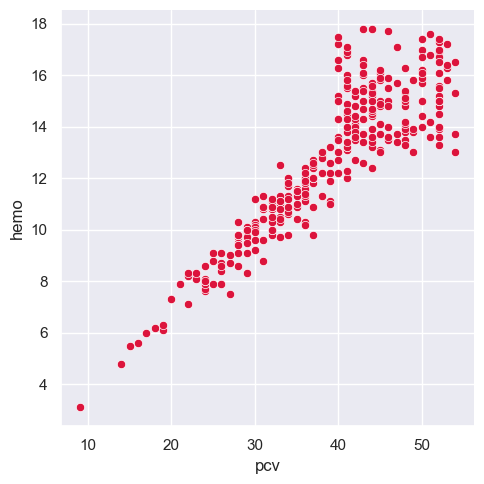

In [74]:
#sns.scatterplot(data=data, x='age', y='bp', hue='dm', size='ane', sizes=(20,200))
sns.relplot(x='pcv', y='hemo',data=data,color='crimson');

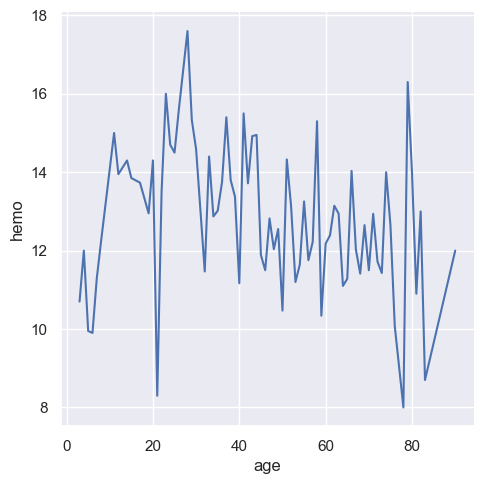

In [75]:
sns.set_theme(style="darkgrid") #setting the grid for all next plots

sns.relplot(data=data, x='age', y='hemo', ci=None, kind='line')

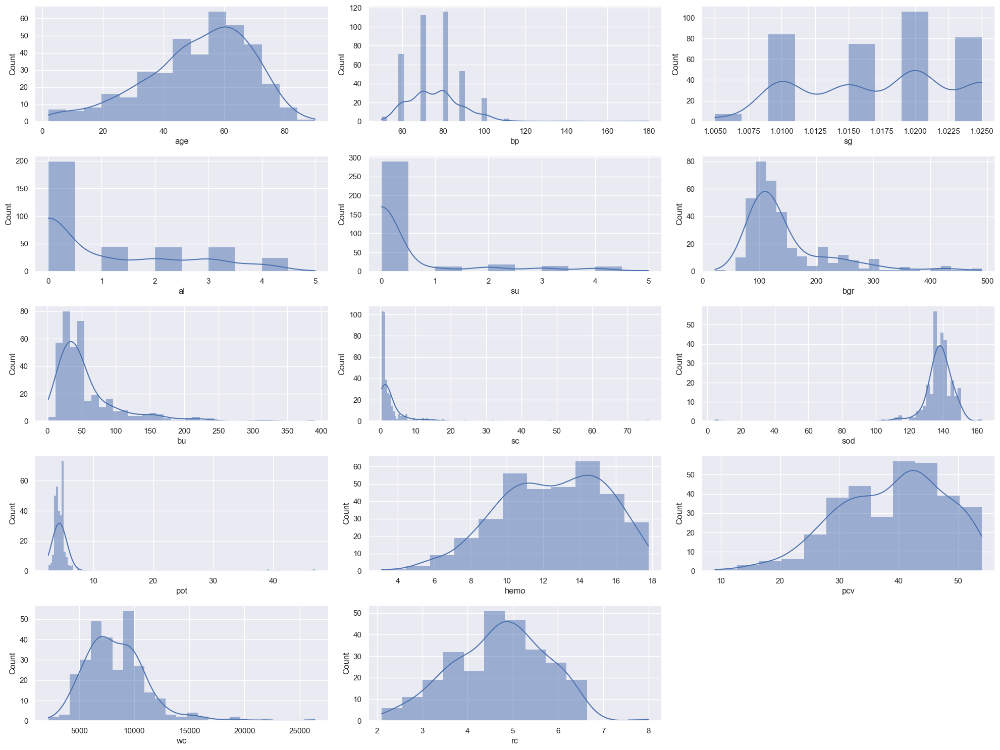

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns
#----------------------------------------
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

#----------------------------------------------
plt.figure(figsize=(20,15))
plotnumber=1
for column in num_col:
    if plotnumber<=14:
        ax = plt.subplot(5,3,plotnumber)
        sns.histplot(data[column],kde=True, stat="count", linewidth=0)
        plt.xlabel(column)
        
    plotnumber += 1 
plt.tight_layout()
plt.show() 

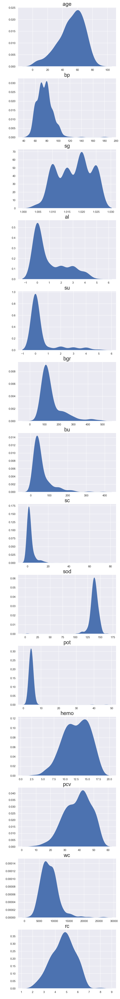

In [77]:
#Distribution
fig,ax=plt.subplots(figsize=(7,70),ncols=1,nrows=14)

i=0
for col in num_col:
    sns.kdeplot(x=data[col],fill=True,alpha=1,ax=ax[i])
    ax[i].set_xlabel(' ')
    ax[i].set_ylabel(' ')
    ax[i].set_title(col,fontsize=21)
    i=i+1
plt.show()

our data have a distribution which is not Gaussian, in order to facilitate the learning of those by the machine we must make them Gaussian by normalizing them

In [78]:
import plotly.express as px
num_cols1 = num_col[:-2]
fig = px.box(data[num_cols1], y=num_cols1)
fig.show()

here we have some outliers but we are not going remove them cause we have a small dataset


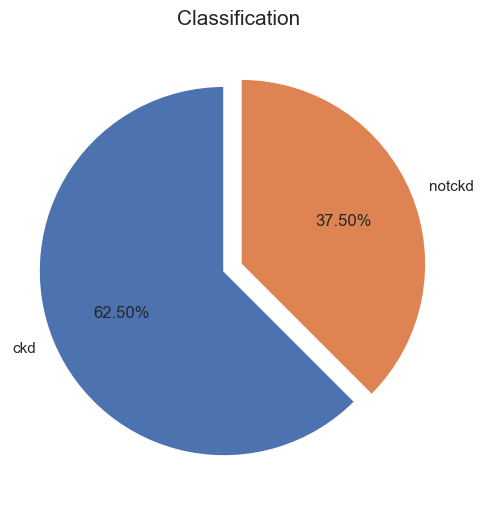

In [79]:
attr_count=data['class'].value_counts()
attr_label=data['class'].value_counts().index

# plot
fig,ax=plt.subplots(figsize=(14,6))
ax.pie(attr_count,explode=(0.1,0),labels=attr_label,autopct='%.2f%%',startangle=90)
ax.set_title("Classification ",fontsize=15)
plt.show()

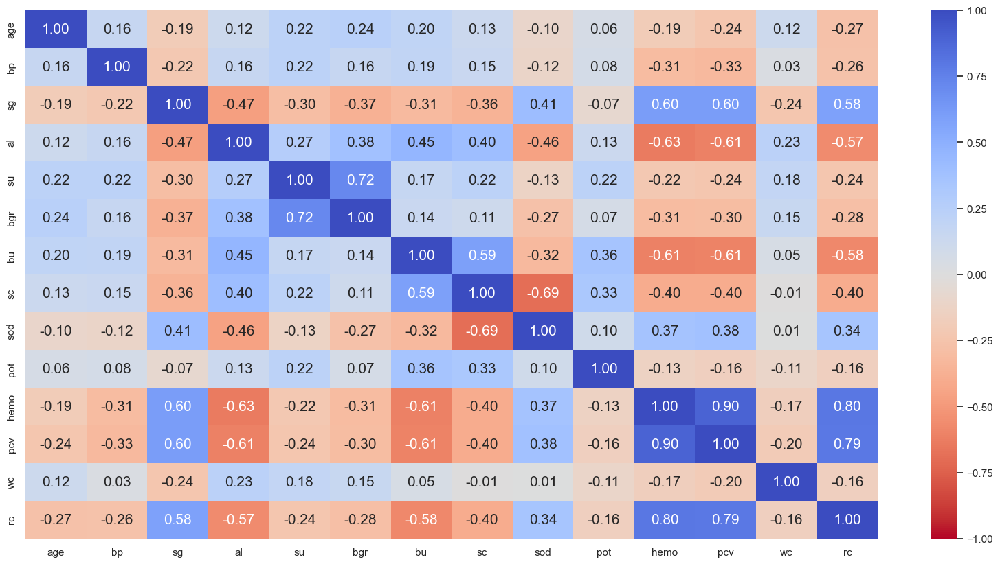

In [80]:
#correlation matrix
correlation_matrix = data[num_col].corr()
plt.figure(figsize=(20,10))
sns.heatmap(correlation_matrix, cmap="coolwarm_r",annot_kws={'fontsize':15}, fmt=".2f", annot=True, vmin=-1, vmax=1)
plt.show()

<font color='blue' ><h3> 
PREPROCESSING </p><h3>

### Data Cleaning

In [81]:
#Handling Nan Values
data.isnull().sum()

age        9
bp        12
sg        47
al        46
su        49
rbc      152
pc        65
pcc        4
ba         4
bgr       44
bu        19
sc        17
sod       87
pot       88
hemo      52
pcv       71
wc       106
rc       131
htn        2
dm         2
cad        2
appet      1
pe         1
ane        1
class      0
dtype: int64

In [82]:
data.isnull().sum().sum()

1012

In [83]:
#fixer les valeurs numériques nulles
for i in ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot',
       'hemo', 'pcv', 'wc', 'rc']:
    data[i].fillna(data[i].mean(),inplace=True)

In [84]:
#fixer les valeurs nominales nulles
data['bp'] = data['bp'].fillna(data['bp'].mode()[0])
data['su'] = data['su'].fillna(data['su'].mode()[0])
data['rbc'] = data['rbc'].fillna(data['rbc'].mode()[0])
data['pc'] = data['pc'].fillna(data['pc'].mode()[0])
data['pcc'] = data['pcc'].fillna(data['pcc'].mode()[0])
data['ba'] = data['ba'].fillna(data['ba'].mode()[0])
data['htn'] = data['htn'].fillna(data['htn'].mode()[0])
data['dm'] = data['dm'].fillna(data['dm'].mode()[0])
data['cad'] = data['cad'].fillna(data['cad'].mode()[0])
data['appet'] = data['appet'].fillna(data['appet'].mode()[0])
data['pe'] = data['pe'].fillna(data['pe'].mode()[0])
data['ane'] = data['ane'].fillna(data['ane'].mode()[0])


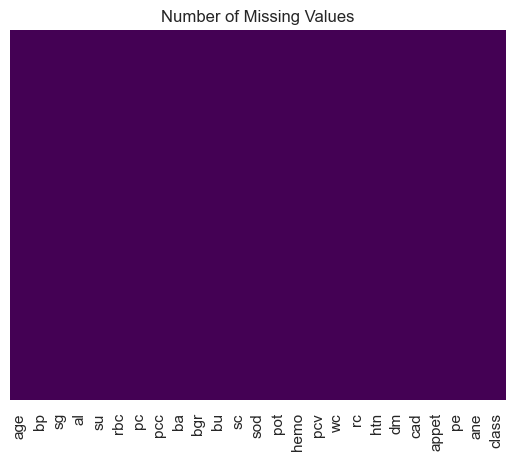

In [85]:
sns.heatmap(data.isnull(),yticklabels=False,cbar=False,cmap='viridis')
plt.title("Number of Missing Values")
plt.savefig('missing_updated.png')

In [86]:
#fixer les outliers

### Feature scaling

slipt numerical and nominal features

In [87]:
#valeurs numériques
data_numeric = data.select_dtypes(include=[np.number])
numeric_cols = data_numeric.columns.values
data_numeric.head()
numeric_cols

array(['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot',
       'hemo', 'pcv', 'wc', 'rc'], dtype=object)

In [88]:
#valeurs nominales
data_non_numeric = data.select_dtypes(exclude=[np.number])
non_numeric_cols = data_non_numeric.columns.values
non_numeric_cols

array(['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane',
       'class'], dtype=object)

Since our nominal data take only two possible values, we can easily use the LabelEncoder

In [89]:
#encoding of non-numerical values
for i in ['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane',
       'class']:
    data[i] = LabelEncoder().fit_transform(data[i])

The technique used to scale the numerical data depends on the type of its distribution. as we don't have a Gaussian distribution we'll use  Normalization

In [90]:
#normalization of numerical values
for i in data.columns:
    data[i] = MinMaxScaler(feature_range=(0,1)).fit_transform(data[i].astype(float).values.reshape(-1, 1))
#scaler = MinMaxScaler(feature_range=(0,1))
#data_normalized=scaler.fit_transform(data_numeric)
#data_normalized



In [91]:
#dataset nettoyé
data.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,class
0,0.522727,0.230769,0.75,0.2,0.0,1.0,1.0,0.0,0.0,0.211538,...,0.777778,0.231405,0.525424,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.056818,0.000000,0.75,0.8,0.0,1.0,1.0,0.0,0.0,0.269309,...,0.644444,0.157025,0.441938,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.681818,0.230769,0.25,0.4,0.6,1.0,1.0,0.0,0.0,0.856838,...,0.488889,0.219008,0.441938,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,0.522727,0.153846,0.00,0.8,0.0,1.0,0.0,1.0,0.0,0.202991,...,0.511111,0.185950,0.305085,1.0,0.0,0.0,1.0,1.0,1.0,0.0
4,0.556818,0.230769,0.25,0.4,0.0,1.0,1.0,0.0,0.0,0.179487,...,0.577778,0.210744,0.423729,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Feature selection

In [129]:
#relationship with target
tg_num_corr=[]

for col in num_col:
    tg_num_corr.append(data[col].corr(data['class']))
    
# create as DataFrame
tg_num_df=pd.DataFrame({'numerical_predictor':num_col,'correlation_w_target':tg_num_corr})

# sort the DataFrmae by the absolute vaue of their correlation coefficient,descending
tg_num_df=tg_num_df.sort_values(by='correlation_w_target',ascending=False).reset_index(drop=True)

tg_num_df

,numerical_predictor,correlation_w_target
0,hemo,0.729628
1,sg,0.698957
2,pcv,0.690060
3,rc,0.590913
4,sod,0.342288
5,pot,-0.076921
6,wc,-0.205274
7,age,-0.225405
8,bp,-0.290600
9,sc,-0.294079


according to the result above we have variables that we can select that are highly correlated with the target:
    "hemo", "pcv", "sg", "rc", "sod", "al", "bgr", "su"

In [280]:
#Separate label from features
X= data.drop('class', axis=1)
y= data['class'].astype(int)


In [281]:
#selectkbest with chi2
from sklearn.feature_selection import SelectKBest, chi2
test=SelectKBest(score_func=chi2, k=10)
fit=test.fit(X, y)
#fit.scores_
x_new=test.fit_transform(X,y)
x_new.shape
X.columns[fit.get_support()]

Index(['sg', 'al', 'su', 'pcc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane'], dtype='object')

In [283]:
#algorithme RFE
from sklearn.ensemble import RandomForestClassifier
rfe_method = RFE(estimator=RandomForestClassifier(), n_features_to_select=10, step=10, verbose=5)

rfe_method.fit(X, y)
mask= rfe_method.support_
reduced= X.iloc[:,mask]
reduced.columns


Fitting estimator with 24 features.
Fitting estimator with 14 features.


Index(['sg', 'al', 'bgr', 'bu', 'sc', 'hemo', 'pcv', 'rc', 'htn', 'dm'], dtype='object')

In [245]:
from sklearn.ensemble import ExtraTreesClassifier
# feature extraction
model = ExtraTreesClassifier(n_estimators=10)
model.fit(X, y)
#print(model.feature_importances_)


ExtraTreesClassifier(n_estimators=10)

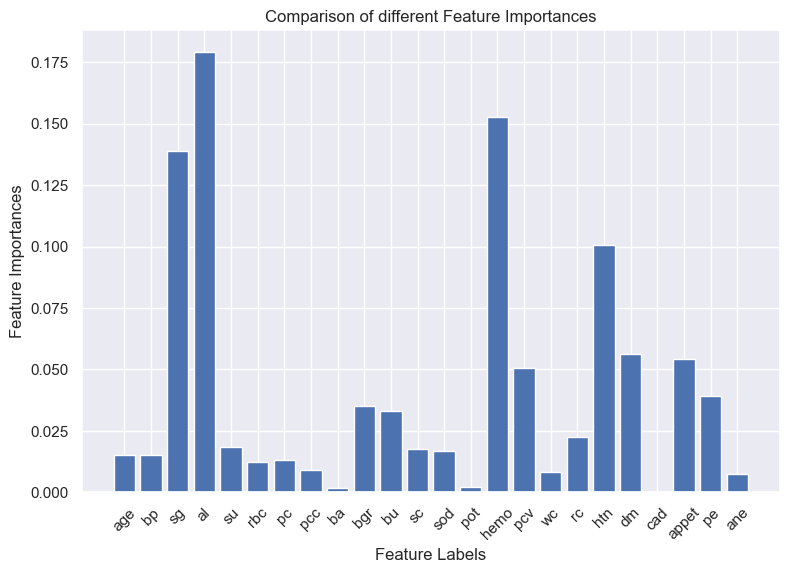

In [246]:
# Plotting a Bar Graph to compare the models
plt.figure(figsize=(9,6))
plt.bar(X.columns, model.feature_importances_)
plt.xticks(rotation=45)
plt.xlabel('Feature Labels')
plt.ylabel('Feature Importances')
plt.title('Comparison of different Feature Importances')
plt.show()

RFE algorithm gives us the closest result to our articles si we gonna use his feature selection

In [247]:
#data with feature selection
X1 = reduced

### data repartition(splitting the dataset)

In [248]:
from sklearn.model_selection import train_test_split
#X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=32,test_size=0.3)
X_train,X_test,y_train,y_test=train_test_split(X1,y,test_size=0.3,random_state=0)

### MODEL

In [249]:
# Using GridSearchCV we find the best algorithm to this problem
from sklearn.model_selection import ShuffleSplit,GridSearchCV,StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier


In [250]:
def find_best_model(x,y):
    models={'Logistic_regression':{'model':LogisticRegression(solver='liblinear',penalty='l2',multi_class='auto'),'parameter':{'C':[1,4,8]}},
           'decision_tree':{'model':DecisionTreeClassifier(splitter='best'),'parameter':{'criterion':['gini','entropy'],'max_depth':[5,7,13,15]}},
           'svm':{'model':SVC(gamma='auto'),'parameter':{'kernel':['sigmoid','linear','poly','rbf'],'C':[1,5,10,15]}},
           'random_forest':{'model':RandomForestClassifier(criterion='gini'),'parameter':{'n_estimators':[30,40,50]}}}
    scores=[]
    cv_shuffle=StratifiedKFold(n_splits=10)
    
    for model_name,model_params in models.items():
        gs=GridSearchCV(model_params['model'],model_params['parameter'],cv=cv_shuffle,return_train_score=False)
        gs.fit(x,y)
        scores.append({'model':model_name,'best_parameters':gs.best_params_,'score':gs.best_score_})
    return pd.DataFrame(scores,columns=['model','best_parameters','score'])
find_best_model(X_train,y_train)

,model,best_parameters,score
0,Logistic_regression,{'C': 4},0.978571
1,decision_tree,"{'criterion': 'gini', 'max_depth': 15}",0.967857
2,svm,"{'C': 5, 'kernel': 'linear'}",0.989286
3,random_forest,{'n_estimators': 30},0.978571


## SVM

In [251]:
from sklearn.svm import SVC
#train model
svm = SVC()
svm.fit(X_train, y_train)


SVC()

In [252]:
#Model performance
y_pred_svc_1 = svm.predict(X_test)
#classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_svc_1 ))
from sklearn.metrics import accuracy_score

print("the accuracy is:", accuracy_score(y_pred_svc_1, y_test))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99        72
           1       0.96      1.00      0.98        48

    accuracy                           0.98       120
   macro avg       0.98      0.99      0.98       120
weighted avg       0.98      0.98      0.98       120

the accuracy is: 0.9833333333333333


#### Linear kernel

In [253]:
svm = SVC(kernel="linear")
svm.fit(X_train, y_train)
from sklearn.metrics import classification_report
y_pred_svc_2 = svm.predict(X_test)
print(classification_report(y_pred_svc_2, y_test))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        70
           1       1.00      0.96      0.98        50

    accuracy                           0.98       120
   macro avg       0.99      0.98      0.98       120
weighted avg       0.98      0.98      0.98       120



#### Polynomial kernel

In [254]:
svm = SVC(kernel="poly")
svm.fit(X_train, y_train)
from sklearn.metrics import classification_report
y_pred_svc_3 = svm.predict(X_test)
print(classification_report(y_pred_svc_3, y_test))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99        71
           1       1.00      0.98      0.99        49

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120



#### Sigmoid kernel

In [255]:
svm = SVC(kernel="sigmoid")
svm.fit(X_train, y_train)
from sklearn.metrics import classification_report
y_pred_svc_4 = svm.predict(X_test)
print(classification_report(y_pred_svc_4, y_test))

              precision    recall  f1-score   support

           0       0.68      0.72      0.70        68
           1       0.60      0.56      0.58        52

    accuracy                           0.65       120
   macro avg       0.64      0.64      0.64       120
weighted avg       0.65      0.65      0.65       120



#### Gaussian RBF model

In [256]:
svm = SVC(kernel="rbf")
svm.fit(X_train, y_train)
from sklearn.metrics import classification_report
y_pred = svm.predict(X_test)
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99        70
           1       1.00      0.96      0.98        50

    accuracy                           0.98       120
   macro avg       0.99      0.98      0.98       120
weighted avg       0.98      0.98      0.98       120



#### comparaison des résultats

In [257]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

s1=accuracy_score(y_test, y_pred_svc_1)
s2=accuracy_score(y_test, y_pred_svc_2)
s3=accuracy_score(y_test, y_pred_svc_3)
s4=accuracy_score(y_test, y_pred_svc_4)
s5=accuracy_score(y_test,y_pred)

models = pd.DataFrame({
    'Model': ['Support Vector Machines no kernel', 'Support Vector Machines Linear','Support Vector Machines polynomial',
              'Support Vector Machines sigmoïd','support vector Machines RBF'],
    'Score': [s1,s2, s3, 
              s4,s5]})
models.sort_values(by="Score",ascending=False)

,Model,Score
2,Support Vector Machines polynomial,0.991667
0,Support Vector Machines no kernel,0.983333
1,Support Vector Machines Linear,0.983333
4,support vector Machines RBF,0.983333
3,Support Vector Machines sigmoïd,0.650000


## KNN

In [258]:
#Import k-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier


Text(0, 0.5, 'Score')

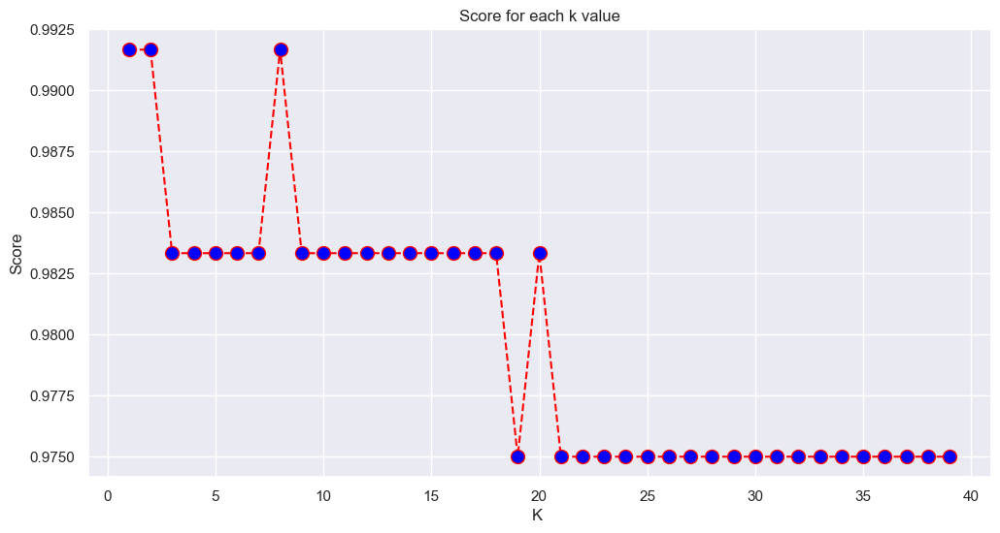

In [259]:
score = []
# Calculate score for k between 1 and 40 
#----------------------------------------
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

#----------------------------------------------

for i in range(1, 40):
    knn = KNeighborsClassifier(i,metric='manhattan')
    knn_model = knn.fit(X_train, y_train)
    pred_i = knn_model.predict(X_test)
    score.append(knn_model.score(X_test, y_test))
plt.figure(figsize=(12, 6))
plt.plot(range(1, 40), score, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Score for each k value')
plt.xlabel('K ')
plt.ylabel('Score')

In [260]:
#refaire le training avec la meilleure valeur de K
#-----------------------------
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
#-------------------------------------------------
knn = KNeighborsClassifier(8)
knn_model = knn.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)

In [261]:
#Accuracy
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))

Accuracy of K-NN classifier on training set: 0.99
Accuracy of K-NN classifier on test set: 0.99


In [262]:
#classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_knn))
from sklearn.metrics import accuracy_score

print("the accuracy is:", accuracy_score(y_pred_knn, y_test))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99        72
           1       0.98      1.00      0.99        48

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120

the accuracy is: 0.9916666666666667


## Decision tree

In [263]:
#Fit, predict                             
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree_model = dtree.fit(X_train, y_train)
y_pred_dtree = dtree_model.predict(X_test)

In [264]:
#Evaluate the model using accuracy and confusion matrix
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_dtree))
from sklearn.metrics import accuracy_score

print("the accuracy is:", accuracy_score(y_pred_dtree, y_test))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95        72
           1       0.96      0.90      0.92        48

    accuracy                           0.94       120
   macro avg       0.94      0.93      0.94       120
weighted avg       0.94      0.94      0.94       120

the accuracy is: 0.9416666666666667


### LOGISTIC REGRESSION

In [304]:
#instanciation du modèle
from sklearn import linear_model
modele_regLog = linear_model.LogisticRegression(random_state = 0,
solver = 'liblinear', multi_class = 'auto')
#training
modele_regLog.fit(X_train,y_train)


LogisticRegression(random_state=0, solver='liblinear')

In [305]:
#précision du modèle
precision = modele_regLog.score(X_test,y_test)
print(precision*100)

97.5


In [306]:
from sklearn.metrics import classification_report
y_pred_Lr = modele_regLog.predict(X_test)
print(classification_report(y_pred_Lr, y_test))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        69
           1       1.00      0.94      0.97        51

    accuracy                           0.97       120
   macro avg       0.98      0.97      0.97       120
weighted avg       0.98      0.97      0.97       120



### Ensemble Learning Adaboost

In [307]:
#Fit, predict
from sklearn.ensemble import AdaBoostClassifier
abc = AdaBoostClassifier(n_estimators=50,
                         learning_rate=1)
model = abc.fit(X_train, y_train)
y_pred = model.predict(X_test)

Accuracy: 0.9833333333333333


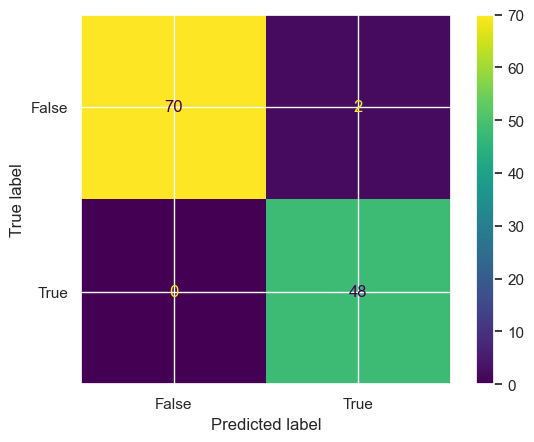

In [308]:
#Evaluate the model using accuracy and confusion matrix
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
#confusion matrix

confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

### Random Forest Classifier

In [284]:
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=50, max_features="auto", random_state=44)
rf_model.fit(X_train, y_train)
y_pred_rf= rf_model.predict(X_test)

In [285]:
from sklearn.metrics import accuracy_score

print("the accuracy is:", accuracy_score(y_pred_rf, y_test))

the accuracy is: 0.9916666666666667


In [286]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99        72
           1       1.00      0.98      0.99        48

    accuracy                           0.99       120
   macro avg       0.99      0.99      0.99       120
weighted avg       0.99      0.99      0.99       120



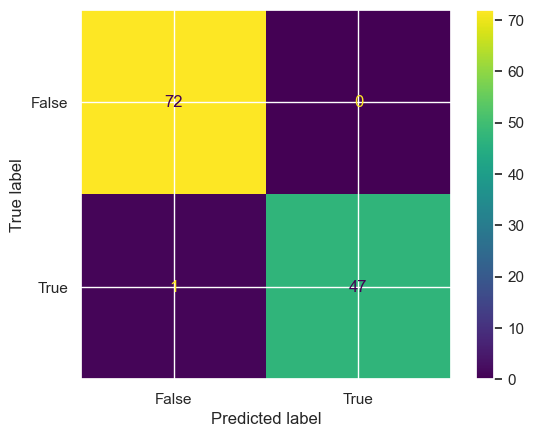

In [274]:
#confusion matrix
from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_test, y_pred_rf)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

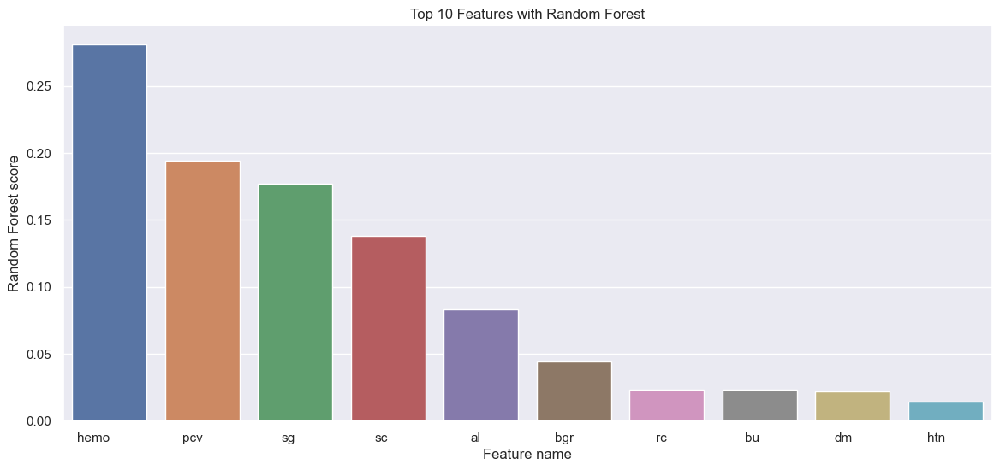

In [287]:
# Top 10 Features
from sklearn.ensemble import RandomForestClassifier

feature_scores=pd.DataFrame(rf_model.feature_importances_,columns=['Score'],index=X_train.columns).sort_values(by='Score',ascending=False)
top10_feature = feature_scores.nlargest(n=10, columns=['Score'])

plt.figure(figsize=(14,6))
g = sns.barplot(x=top10_feature.index, y=top10_feature['Score'])
p = plt.title('Top 10 Features with Random Forest')
p = plt.xlabel('Feature name')
p = plt.ylabel('Random Forest score')
p = g.set_xticklabels(g.get_xticklabels(), horizontalalignment='right')

## Prediction

In [297]:
X_train=X_train[['sg', 'al', 'bgr', 'bu', 'sc', 'hemo', 'pcv', 'rc', 'htn', 'dm']]
X_test=X_test[['sg', 'al', 'bgr', 'bu', 'sc', 'hemo', 'pcv', 'rc', 'htn', 'dm']]
rf_model.fit(X_train,y_train)
def predict(sg, al, bgr, bu, sc, hemo, pcv, rc, htn, dm):
    sg=float(sg)
    al=float(al)
    bgr=float(bgr)
    bu=float(bu)
    sc=int(sc)
    hemo=float(hemo)
    pcv=float(pcv)
    rc=float(rc)
    htn=float(htn)
    dm=float(dm)
    
    x=[[sg, al, bgr, bu, sc, hemo, pcv, rc, htn, dm]]
    return rf_model.predict(x)

In [300]:
# Prediction 1
# input parameter : sg(sugar), al(albumin), bgr(blood glucose random), bu(blood urea), sc(serum creatinine), hemo(homoglobine)
#pcv(packed cell volume), rc(red blood cellcount), htn(hypertension), dm(diabete mellitus)
prediction = predict(1.015,3.0,74.0,25.0,1.1,12.2,39.0,4.4,1.0,1.0)[0]
if prediction:
  print('Oops! You have Chronic Kidney Disease.')
else:
  print("Great! You don't have Chronic Kidney Disease.")

Great! You don't have Chronic Kidney Disease.
